# 🌿 한국 산업별 탄소 발자국 분석 — KR_EEIO 모델

---

이 노트북은 **한국은행 투입산출표(IO Table)**와 **산업별 온실가스 배출량 데이터**를 결합하여,
각 산업이 1백만 원어치를 생산할 때 **공급망 전체에서 얼마나 탄소를 유발하는지** 정량적으로 분석합니다.


| 분석 기준 | 용도 |
|-----------|------|
| **경상가격** (명목, 해당 연도 시장가격) | 기업 실무 시뮬레이터 · 절대 금액 기준 탄소 계산 |
| **불변가격** (2020년 기준년 상대가격)   | 연도별 **시계열 비교** · 가격 효과 제거 분석 |

> ⚙️ **핵심 소스코드는 모두 `eeio_core_최종.py` 에 정의되어 있습니다.**

---

[Gitlab 데이터사이언스팀/kr_eeio](https://bidas-gitlab.boknet.intra/2620316/kr_eeio/-/tree/main/) 페이지에서 KR-EEIO 탄소배출 분석 파이프라인의 모든 코드와 데이터를 확인할 수 있음.

In [ ]:
import os, sys, glob
sys.path.insert(0, '.')

from eeio_core_최종 import (
    load_ghg_data,
    show_dashboard_year,
    show_facet_timeseries_image,
)
from IPython.display import display, HTML

OUTPUT_DIR = './output'
os.makedirs(OUTPUT_DIR, exist_ok=True)
GHG_FILE = '2015-2023산업별_온실가스_추정_FF_송부.xlsx'

---

# 📗 경상가격 분석


## 📋 온실가스 배출량 데이터 미리보기

한국 33개 산업의 2015~2023년 온실가스 배출량입니다.  
원본 단위는 kt CO₂eq이며, **×1000 → t CO₂eq** 로 변환하여 표시합니다.

In [ ]:
clean_ghg_c = load_ghg_data(GHG_FILE)

_year_cols = [c for c in clean_ghg_c.columns if c.isdigit() and 2000 <= int(c) <= 2100]
_preview = clean_ghg_c[['코드', '산업명'] + _year_cols].copy()
_preview[_year_cols] = (_preview[_year_cols] * 1000).round(1)

display(HTML(
    "<div style='background:#f0fdf4;padding:10px;border-left:5px solid #16a34a;margin-bottom:10px'>"
    "<b>📋 온실가스 데이터 미리보기 (단위: t CO₂eq)</b></div>"
))
display(_preview)

✅ 온실가스 데이터 로드 완료  |  산업 수: 32개  |  연도: ['2015', '2020', '2021', '2022', '2023']


,코드,산업명,2015,2020,2021,2022,2023
0,A,농림수산품,28555120.0,27522000.0,27013310.0,26549120.0,26208380.0
1,B,광산품,999812.8,1079380.8,1118042.6,1151491.5,1111698.8
2,C01,음식료품,1915740.0,2045760.0,2111820.0,2218730.0,2065050.0
3,C02,섬유 및 가죽제품,4997810.0,4146230.0,4368200.0,4233460.0,4524770.0
4,C03,"목재 및 종이, 인쇄",1092470.0,2523370.0,2504500.0,2812900.0,2843750.0
5,C04,석탄 및 석유제품,35181364.4,33423863.8,33953512.8,34296898.0,36668041.6
6,C05,화학제품,62139900.0,78677300.0,87060530.0,84691740.0,84687500.0
7,C06,비금속광물제품,42987534.2,37377450.9,39163190.2,37524065.2,35157346.0
8,C07,1차 금속제품,113228040.0,106174310.0,109192330.0,100331570.0,102537670.0
9,C08,금속가공제품,1237350.0,417960.0,415529.4,362965.5,368275.4


---

# 📗 경상가격 분석


## 🧭 산업별 Scope 1/2/3 종합 대시보드 (경상가격)

연도를 입력하면 해당 연도의 전체 요약 표지와 전 산업 카드가 순서대로 출력됩니다.


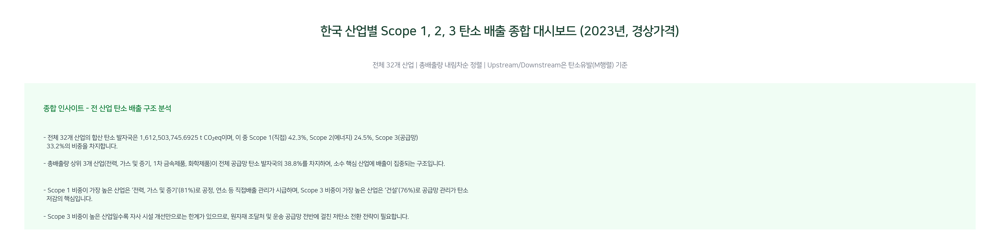

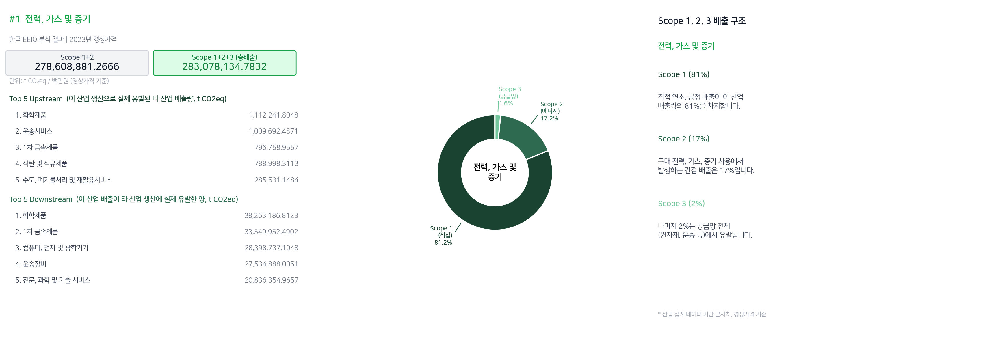

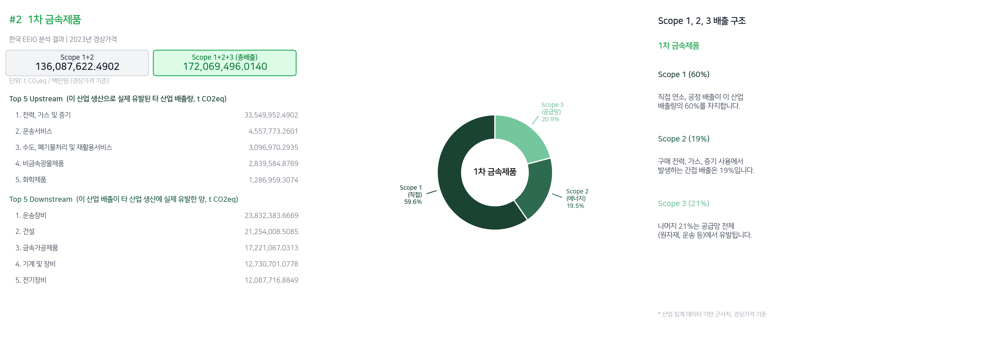

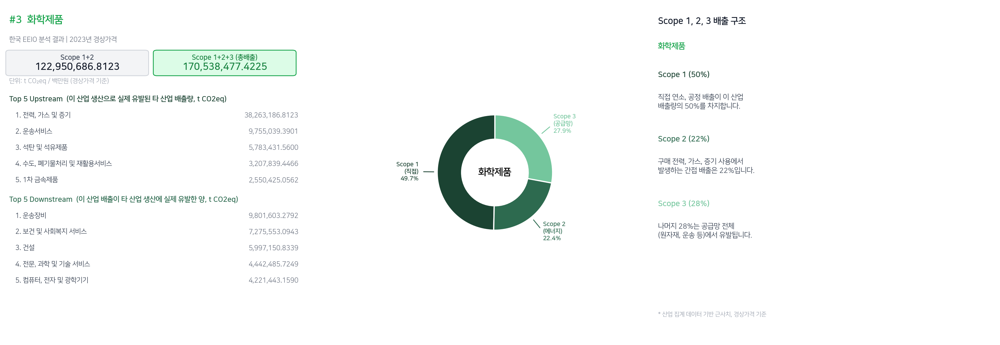

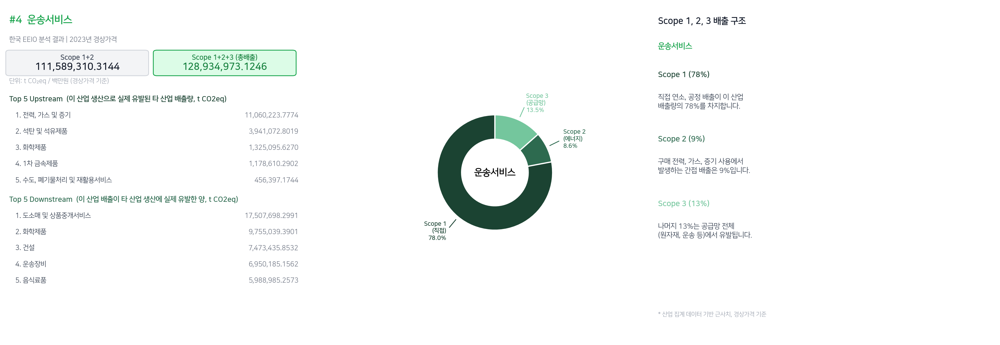

...

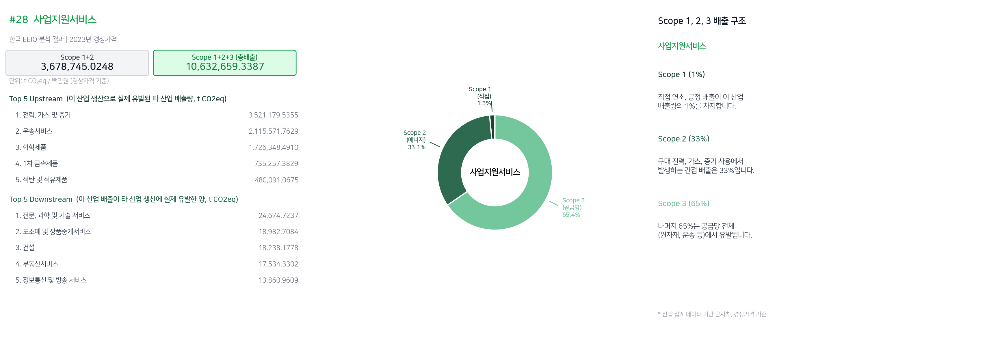

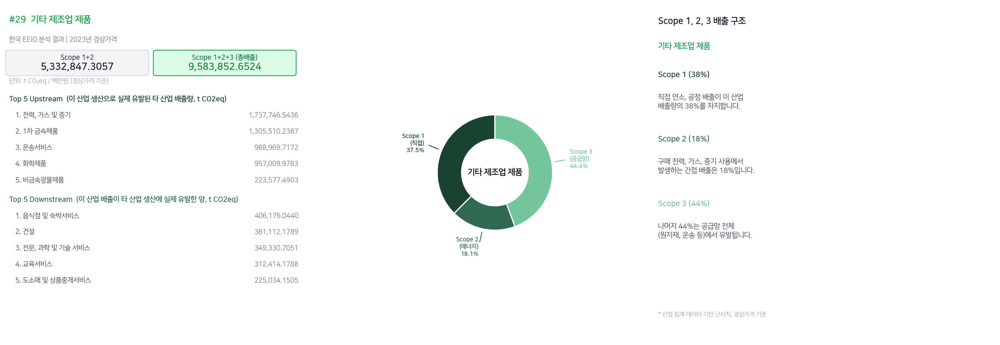

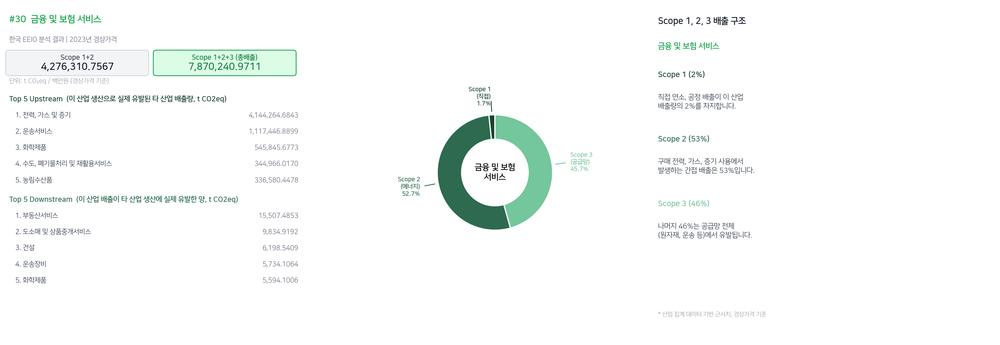

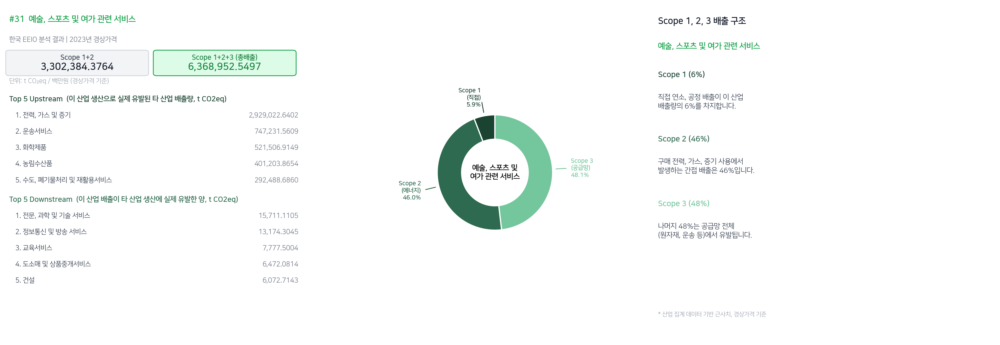

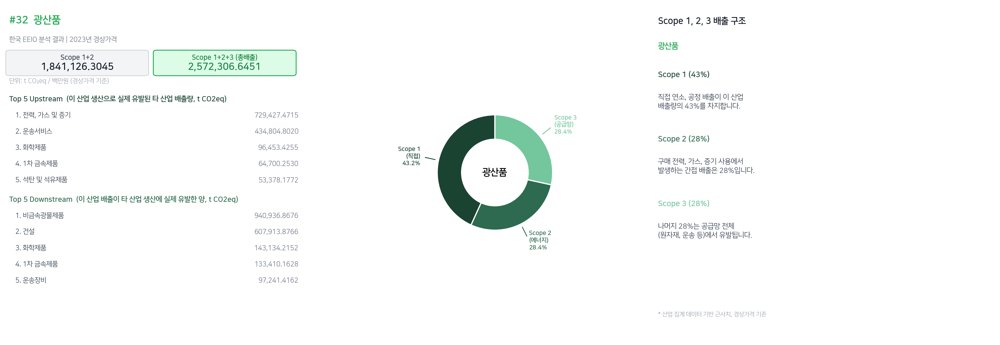

✅ 2023년 경상가격 대시보드 전체 (32개 산업) 출력 완료.


In [ ]:
# 연도를 바꿔서 실행하세요 (예: '2015', '2020', '2021', '2022', '2023')
_year = '2023'

show_dashboard_year(_year, p_type='경상', output_dir=OUTPUT_DIR)

---

# 📊 EEIO 행렬 엑셀

분석 결과 엑셀 파일은 `output/` 폴더에 연도·가격기준별로 이미 저장되어 있습니다.

| 시트 | 내용 |
|------|------|
| **설명** | 각 시트 기호·설명 |
| **T_mat_GHG** | 총거래표 + 온실가스 배출량 행 |
| **Ad** | 국산투입계수 |
| **Lf** | 레온티에프 역행렬 |
| **M** | 온실가스 배출유발계수 diag(B)·Lf |
| **M.Fd** | 최종수요 성분별 배출량 |
| **M.X(diag)** | 금액 유발행렬 (M x diag(X)) |
| **Scopes** | Scope 1/2/3 (전력 이중계산 보정) |
| **I_mat** | 수입거래표 |
| **D_mat** | 국산거래표 |


## 📁 저장 위치

`output/{year}_KR_EEIO_{경상|불변}.xlsx` 형태로 연도별·가격기준별 파일이 저장되어 있습니다.  
예: `output/2023_KR_EEIO_경상.xlsx`, `output/2023_KR_EEIO_불변.xlsx`


In [ ]:
_xlsx_files = sorted(glob.glob(os.path.join(OUTPUT_DIR, '*_KR_EEIO_*.xlsx')))
print(f'📁 {OUTPUT_DIR} 안에 저장된 EEIO 엑셀 파일 ({len(_xlsx_files)}개):')
for f in _xlsx_files:
    print(' -', os.path.basename(f))

📁 ./output 안에 저장된 EEIO 엑셀 파일 (10개):
 - 2015_KR_EEIO_경상.xlsx
 - 2015_KR_EEIO_불변.xlsx
 - 2020_KR_EEIO_경상.xlsx
 - 2020_KR_EEIO_불변.xlsx
 - 2021_KR_EEIO_경상.xlsx
 - 2021_KR_EEIO_불변.xlsx
 - 2022_KR_EEIO_경상.xlsx
 - 2022_KR_EEIO_불변.xlsx
 - 2023_KR_EEIO_경상.xlsx
 - 2023_KR_EEIO_불변.xlsx


---

# 📘 경상가격 분석


## 📋 산업별 직접배출계수(B) vs 총배출계수(B×L) 시계열 비교 (경상가격)

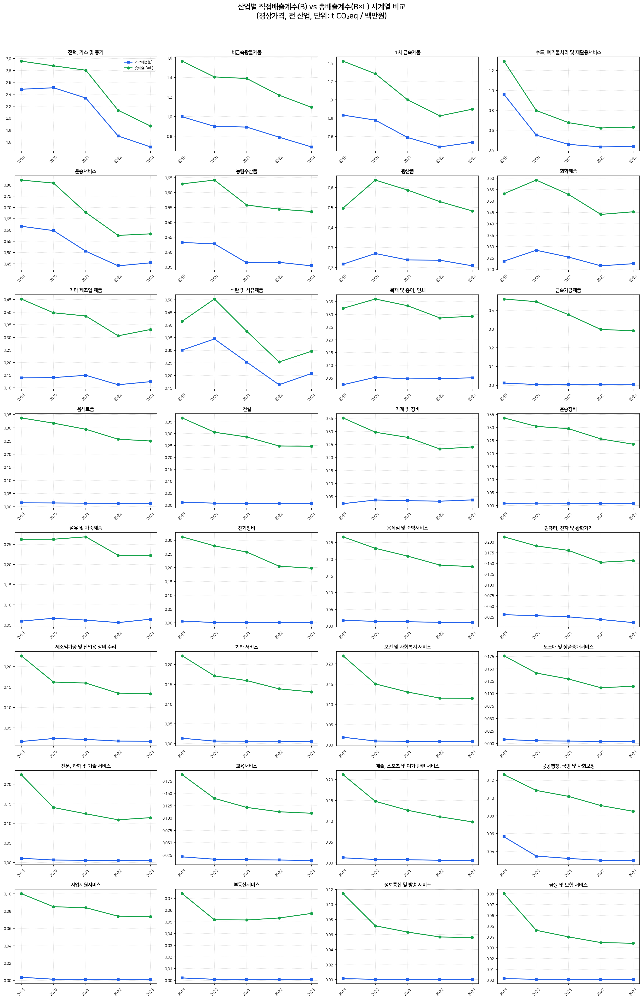

In [ ]:
show_facet_timeseries_image(p_type='경상', output_dir=OUTPUT_DIR)

---

# 📘 불변가격 분석


## 📋 산업별 직접배출계수(B) vs 총배출계수(B×L) 시계열 비교 (불변가격)



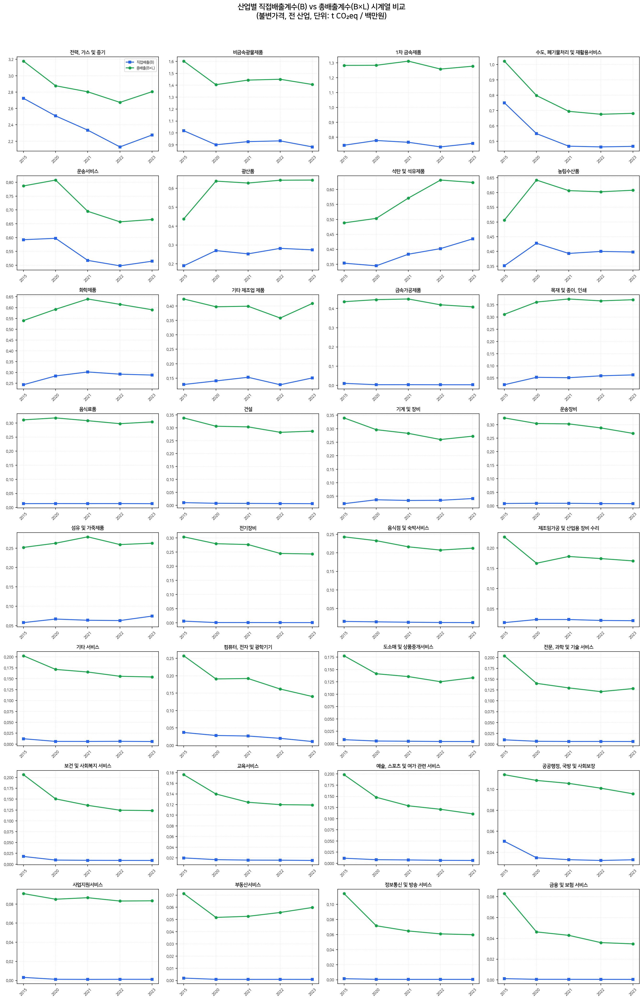

In [ ]:
show_facet_timeseries_image(p_type='불변', output_dir=OUTPUT_DIR)
